In [52]:
import numpy as np
import math
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pickle

from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split

from tensorflow import keras
from tensorflow.keras import backend as K
from tensorflow.keras import initializers
from tensorflow.keras.utils import to_categorical,plot_model

from tensorflow.keras.models import Sequential, Model, load_model
import tensorflow.keras.layers as layers

# for data augmentation
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint,EarlyStopping

from skimage.transform import resize
import cv2

from PIL import Image
import os
from shutil import copyfile

from datetime import datetime

# for plotting ROC curves
from sklearn.multiclass import OneVsRestClassifier
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc

# 1. Load the data and convert labels to one-hot encoded labels

In [2]:
# Load the dataset

#Choose the categories of images to be classified
category_names=['agricultural',
                'forest',
                'mobilehomepark',
                'overpass',
                'parkinglot',
                'river',
                'runway',
                'sparseresidential']

Image_dir='data/UCMerced_LandUse/Images'

num_images=100 # in each category
num_classes=len(category_names)
patch_size=256 # size of each image
num_channels=3 # since they are color images

images_orig=[]
labels_num=[]

for i in range(len(category_names)):
    for j in range(num_images):
        
        img_path=os.path.join(
            Image_dir,category_names[i],
            category_names[i]+'{:02d}.tif'.format(j))
        new_image=Image.open(img_path)
        
        # normalize
        new_image=(np.asarray(new_image)).astype('float32')
        new_image /= 255
        
        # resize to (64,64)
        resized_image=resize(
            new_image,(patch_size//4,patch_size//4,num_channels))
        arr=np.asarray(resized_image)
        
        images_orig.append(arr)
        labels_num.append([i])
        
images_orig=np.array(images_orig)
labels_num=np.array(labels_num)

print('Images Shape = {}'.format(images_orig.shape))
print('Labels Shape = {}'.format(labels_num.shape))

# Save the extracted dataset for future use
np.save('data/UCMerced_images_orig_8Class_normalized.npy',images_orig)
np.save('data/UCMerced_labels_num_8Class_normalized.npy',labels_num)

Images Shape = (800, 64, 64, 3)
Labels Shape = (800, 1)


In [3]:
# Convert the labels to one-hot encoded labels

labels=to_categorical(labels_num, num_classes)

# take a look at the one-hot encoded labels
print('One-hot encoded labels include:')
for i in range(num_classes):
    print(labels[i*num_images])
    
print('\nOne-hot encoded Labels Shape = {}'.format(labels.shape))

One-hot encoded labels include:
[1. 0. 0. 0. 0. 0. 0. 0.]
[0. 1. 0. 0. 0. 0. 0. 0.]
[0. 0. 1. 0. 0. 0. 0. 0.]
[0. 0. 0. 1. 0. 0. 0. 0.]
[0. 0. 0. 0. 1. 0. 0. 0.]
[0. 0. 0. 0. 0. 1. 0. 0.]
[0. 0. 0. 0. 0. 0. 1. 0.]
[0. 0. 0. 0. 0. 0. 0. 1.]

One-hot encoded Labels Shape = (800, 8)


# 2. Split train, val and test

In [4]:
tot_images=images_orig.shape[0] #total number of images

# train/test split
x_train, x_test, y_train, y_test=train_test_split(
    images_orig,labels,test_size=0.2,
    stratify=labels,random_state=999)

# split part of data in train set to be valudation set
x_train, x_val, y_train, y_val=train_test_split(
    x_train,y_train,test_size=0.25,
    stratify=y_train,random_state=666)

print('Train features set size = {}'.format(x_train.shape))
print('Validation features set size = {}'.format(x_val.shape))
print('Test size features set = {}'.format(x_test.shape))

print('\n')

print('Train label set size = {}'.format(y_train.shape))
print('Validation label set size = {}'.format(y_val.shape))
print('Test label set size= {}'.format(y_test.shape))

Train features set size = (480, 64, 64, 3)
Validation features set size = (160, 64, 64, 3)
Test size features set = (160, 64, 64, 3)


Train label set size = (480, 8)
Validation label set size = (160, 8)
Test label set size= (160, 8)


# 3. CNN Base Model

In [5]:
input_shape=(patch_size//4,patch_size//4,num_channels)
pool_size=(3,3)
prob_drop_hidden=0.5 # drop_out probability

def CNN_base():
    
    model=Sequential()
    
    # conv1 layer (Convolution + MaxPooling layers)
    model.add(layers.Conv2D(
        filters=64, kernel_size=(3,3), strides=(1,1),
        padding='same', activation='relu', input_shape=input_shape))
    model.add(layers.MaxPooling2D(
        pool_size=pool_size,strides=(2,2),
        padding='same'))
    
    # conv2 layer (Convolution + MaxPooling layers)
    model.add(layers.Conv2D(
        filters=128, kernel_size=(3,3), strides=(1,1),
        padding='same', activation='relu'))
    model.add(layers.MaxPooling2D(
        pool_size=pool_size,strides=(2,2),
        padding='same'))
    
    # conv3 layer (Convolution + MaxPooling layers)
    model.add(layers.Conv2D(
        filters=256, kernel_size=(3,3), strides=(1,1),
        padding='same', activation='relu'))
    model.add(layers.MaxPooling2D(
        pool_size=pool_size,strides=(2,2),
        padding='same'))
    
    # Flatten Layer
    model.add(layers.Flatten())
    
    # fc1 layer
    model.add(layers.Dense(128,activation='relu'))
    model.add(layers.Dropout(rate=prob_drop_hidden))
    
    # fc2 layer
    model.add(layers.Dense(64,activation='relu'))
    model.add(layers.Dropout(rate=prob_drop_hidden))
    
    # Output Layer
    model.add(layers.Dense(num_classes,activation='softmax'))

    return model

In [6]:
# clear the session to make sure the layer names start form index 1
K.clear_session()

model_CNN_base=CNN_base()
model_CNN_base.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 64, 64, 64)        1792      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 32, 32, 128)       73856     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 16, 16, 128)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 16, 16, 256)       295168    
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 8, 8, 256)         0         
_________________________________________________________________
flatten (Flatten)            (None, 16384)             0

# 4. Train the base model

In [7]:
epochs=500
learning_rate=0.001
batch_size=32

batches_per_epoch=y_train.shape[0]//batch_size
validation_steps=y_val.shape[0]//batch_size

# data augmentation

# for the training data
image_gen=ImageDataGenerator(zoom_range=0.1,
                             width_shift_range=5, #pixel
                             height_shift_range=5, #pixel
                             horizontal_flip=True,
                             rotation_range=20)

# for validation/ test data (keep the original data)
image_gen_test=ImageDataGenerator()

# put data into the augmentation generators
train_gen=image_gen.flow(np.array(x_train), y_train,
                         batch_size=batch_size, shuffle = True)
val_gen=image_gen_test.flow(np.array(x_val), y_val,
                            batch_size=batch_size, shuffle=True)

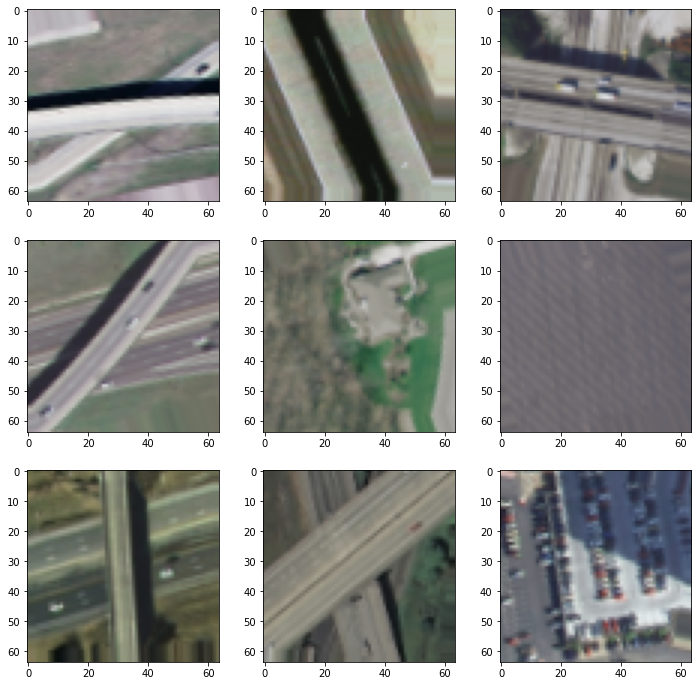

In [8]:
# see how figures look after augmentation

plt.figure(figsize=(12,12))

x_batch, y_batch=train_gen[0] # see the first batch, 0 here is batch index
for i in range(0,9):
    plt.subplot(3,3,i+1)
    plt.imshow(x_batch[i].reshape(64,64,3))
plt.show()

In [12]:
# set the CNN architecture

model=CNN_base()
opt=Adam(lr=learning_rate) #optimizer

model.compile(optimizer=opt,loss='categorical_crossentropy',
              metrics=['accuracy'])

checkpt_best_model='model/8Class_3Conv2Den_dataAugm.hdf5'
es=EarlyStopping(monitor='val_loss', mode='min',
                 verbose=1,patience=60)
mc=ModelCheckpoint(checkpt_best_model,monitor='val_accuracy',
                   mode='max', verbose=1, save_best_only=True)

In [14]:
# fit the model parameters
print('training...')

history=model.fit(x=train_gen,
                  steps_per_epoch=batches_per_epoch,
                  epochs=epochs,
                  validation_data=val_gen,
                  validation_steps=validation_steps,
                  callbacks=[es,mc],
                  verbose=2)
print('done')

training...
Epoch 1/500
15/15 - 4s - loss: 2.1222 - accuracy: 0.0979 - val_loss: 2.0783 - val_accuracy: 0.1250

Epoch 00001: val_accuracy improved from -inf to 0.12500, saving model to model/8Class_3Conv2Den_dataAugm.hdf5
Epoch 2/500
15/15 - 3s - loss: 2.0770 - accuracy: 0.1167 - val_loss: 2.0697 - val_accuracy: 0.1250

Epoch 00002: val_accuracy did not improve from 0.12500
Epoch 3/500
15/15 - 3s - loss: 2.0647 - accuracy: 0.1458 - val_loss: 2.0392 - val_accuracy: 0.1187

Epoch 00003: val_accuracy did not improve from 0.12500
Epoch 4/500
15/15 - 3s - loss: 2.0755 - accuracy: 0.1458 - val_loss: 2.0442 - val_accuracy: 0.1250

Epoch 00004: val_accuracy did not improve from 0.12500
Epoch 5/500
15/15 - 2s - loss: 2.0403 - accuracy: 0.1396 - val_loss: 1.9385 - val_accuracy: 0.1312

Epoch 00005: val_accuracy improved from 0.12500 to 0.13125, saving model to model/8Class_3Conv2Den_dataAugm.hdf5
Epoch 6/500
15/15 - 3s - loss: 1.9705 - accuracy: 0.2333 - val_loss: 1.8536 - val_accuracy: 0.2375



15/15 - 4s - loss: 0.7481 - accuracy: 0.7188 - val_loss: 0.8924 - val_accuracy: 0.6938

Epoch 00047: val_accuracy did not improve from 0.73750
Epoch 48/500
15/15 - 4s - loss: 0.6869 - accuracy: 0.7125 - val_loss: 0.7744 - val_accuracy: 0.7188

Epoch 00048: val_accuracy did not improve from 0.73750
Epoch 49/500
15/15 - 4s - loss: 0.7432 - accuracy: 0.7229 - val_loss: 0.9351 - val_accuracy: 0.7188

Epoch 00049: val_accuracy did not improve from 0.73750
Epoch 50/500
15/15 - 4s - loss: 0.8196 - accuracy: 0.6646 - val_loss: 0.7929 - val_accuracy: 0.7250

Epoch 00050: val_accuracy did not improve from 0.73750
Epoch 51/500
15/15 - 4s - loss: 0.8170 - accuracy: 0.6521 - val_loss: 0.6696 - val_accuracy: 0.7500

Epoch 00051: val_accuracy improved from 0.73750 to 0.75000, saving model to model/8Class_3Conv2Den_dataAugm.hdf5
Epoch 52/500
15/15 - 4s - loss: 0.7449 - accuracy: 0.7083 - val_loss: 0.7211 - val_accuracy: 0.7500

Epoch 00052: val_accuracy did not improve from 0.75000
Epoch 53/500
15/15 

15/15 - 4s - loss: 0.4037 - accuracy: 0.8333 - val_loss: 0.5988 - val_accuracy: 0.8062

Epoch 00097: val_accuracy did not improve from 0.90000
Epoch 98/500
15/15 - 4s - loss: 0.4226 - accuracy: 0.8188 - val_loss: 0.5458 - val_accuracy: 0.8687

Epoch 00098: val_accuracy did not improve from 0.90000
Epoch 99/500
15/15 - 4s - loss: 0.3385 - accuracy: 0.8708 - val_loss: 0.5329 - val_accuracy: 0.8438

Epoch 00099: val_accuracy did not improve from 0.90000
Epoch 100/500
15/15 - 4s - loss: 0.4294 - accuracy: 0.8250 - val_loss: 0.5069 - val_accuracy: 0.8313

Epoch 00100: val_accuracy did not improve from 0.90000
Epoch 101/500
15/15 - 4s - loss: 0.3596 - accuracy: 0.8396 - val_loss: 0.4796 - val_accuracy: 0.8625

Epoch 00101: val_accuracy did not improve from 0.90000
Epoch 102/500
15/15 - 4s - loss: 0.3652 - accuracy: 0.8562 - val_loss: 0.5760 - val_accuracy: 0.8438

Epoch 00102: val_accuracy did not improve from 0.90000
Epoch 103/500
15/15 - 4s - loss: 0.3705 - accuracy: 0.8521 - val_loss: 0.5


Epoch 00148: val_accuracy did not improve from 0.94375
Epoch 149/500
15/15 - 5s - loss: 0.1696 - accuracy: 0.9417 - val_loss: 0.4828 - val_accuracy: 0.9187

Epoch 00149: val_accuracy did not improve from 0.94375
Epoch 150/500
15/15 - 5s - loss: 0.2231 - accuracy: 0.9396 - val_loss: 0.3877 - val_accuracy: 0.9375

Epoch 00150: val_accuracy did not improve from 0.94375
Epoch 151/500
15/15 - 5s - loss: 0.2050 - accuracy: 0.9250 - val_loss: 0.3260 - val_accuracy: 0.9312

Epoch 00151: val_accuracy did not improve from 0.94375
Epoch 152/500
15/15 - 5s - loss: 0.1840 - accuracy: 0.9354 - val_loss: 0.3157 - val_accuracy: 0.9500

Epoch 00152: val_accuracy improved from 0.94375 to 0.95000, saving model to model/8Class_3Conv2Den_dataAugm.hdf5
Epoch 153/500
15/15 - 4s - loss: 0.2158 - accuracy: 0.9312 - val_loss: 0.4027 - val_accuracy: 0.9250

Epoch 00153: val_accuracy did not improve from 0.95000
Epoch 154/500
15/15 - 4s - loss: 0.2464 - accuracy: 0.9208 - val_loss: 0.4088 - val_accuracy: 0.9250


15/15 - 4s - loss: 0.1593 - accuracy: 0.9646 - val_loss: 0.3391 - val_accuracy: 0.9438

Epoch 00200: val_accuracy did not improve from 0.95625
Epoch 201/500
15/15 - 4s - loss: 0.1367 - accuracy: 0.9604 - val_loss: 0.4009 - val_accuracy: 0.9250

Epoch 00201: val_accuracy did not improve from 0.95625
Epoch 202/500
15/15 - 4s - loss: 0.1089 - accuracy: 0.9625 - val_loss: 0.3544 - val_accuracy: 0.9312

Epoch 00202: val_accuracy did not improve from 0.95625
Epoch 203/500
15/15 - 4s - loss: 0.1279 - accuracy: 0.9604 - val_loss: 0.3970 - val_accuracy: 0.9375

Epoch 00203: val_accuracy did not improve from 0.95625
Epoch 204/500
15/15 - 4s - loss: 0.1286 - accuracy: 0.9708 - val_loss: 0.5334 - val_accuracy: 0.9187

Epoch 00204: val_accuracy did not improve from 0.95625
Epoch 205/500
15/15 - 4s - loss: 0.1583 - accuracy: 0.9396 - val_loss: 0.4774 - val_accuracy: 0.9312

Epoch 00205: val_accuracy did not improve from 0.95625
Epoch 206/500
15/15 - 4s - loss: 0.1155 - accuracy: 0.9438 - val_loss: 0

15/15 - 4s - loss: 0.1692 - accuracy: 0.9500 - val_loss: 0.5128 - val_accuracy: 0.9062

Epoch 00252: val_accuracy did not improve from 0.96250
Epoch 253/500
15/15 - 4s - loss: 0.1629 - accuracy: 0.9500 - val_loss: 0.3214 - val_accuracy: 0.9250

Epoch 00253: val_accuracy did not improve from 0.96250
Epoch 254/500
15/15 - 4s - loss: 0.1448 - accuracy: 0.9667 - val_loss: 0.3319 - val_accuracy: 0.9187

Epoch 00254: val_accuracy did not improve from 0.96250
Epoch 255/500
15/15 - 4s - loss: 0.1383 - accuracy: 0.9688 - val_loss: 0.4711 - val_accuracy: 0.9000

Epoch 00255: val_accuracy did not improve from 0.96250
Epoch 256/500
15/15 - 4s - loss: 0.1261 - accuracy: 0.9688 - val_loss: 0.3743 - val_accuracy: 0.9125

Epoch 00256: val_accuracy did not improve from 0.96250
Epoch 257/500
15/15 - 4s - loss: 0.1177 - accuracy: 0.9563 - val_loss: 0.2509 - val_accuracy: 0.9438

Epoch 00257: val_accuracy did not improve from 0.96250
Epoch 258/500
15/15 - 4s - loss: 0.1401 - accuracy: 0.9583 - val_loss: 0


Epoch 00304: val_accuracy did not improve from 0.96250
Epoch 305/500
15/15 - 4s - loss: 0.0898 - accuracy: 0.9708 - val_loss: 0.3762 - val_accuracy: 0.9375

Epoch 00305: val_accuracy did not improve from 0.96250
Epoch 306/500
15/15 - 4s - loss: 0.1098 - accuracy: 0.9604 - val_loss: 0.2637 - val_accuracy: 0.9500

Epoch 00306: val_accuracy did not improve from 0.96250
Epoch 307/500
15/15 - 4s - loss: 0.0987 - accuracy: 0.9750 - val_loss: 0.3683 - val_accuracy: 0.9375

Epoch 00307: val_accuracy did not improve from 0.96250
Epoch 308/500
15/15 - 4s - loss: 0.1132 - accuracy: 0.9667 - val_loss: 0.3427 - val_accuracy: 0.9500

Epoch 00308: val_accuracy did not improve from 0.96250
Epoch 309/500
15/15 - 4s - loss: 0.1382 - accuracy: 0.9479 - val_loss: 0.3246 - val_accuracy: 0.9500

Epoch 00309: val_accuracy did not improve from 0.96250
Epoch 310/500
15/15 - 4s - loss: 0.0839 - accuracy: 0.9708 - val_loss: 0.3232 - val_accuracy: 0.9500

Epoch 00310: val_accuracy did not improve from 0.96250
Ep

In [19]:
def history_plot(model_id,history):
    plt.figure(figsize=(8,10))
    
    # plot loss
    plt.subplot(2,1,1)
    plt.title('Cross Entropy Loss -'+model_id,fontsize=12)
    plt.plot(history.history['loss'],color='blue',label='train')
    plt.plot(history.history['val_loss'],color='orange',label='val')
    plt.xlabel('Epochs',fontsize=12)
    plt.ylabel('Loss',fontsize=12)
    plt.legend(loc='upper right')
    
    # plot accuracy
    plt.subplot(2,1,2)
    plt.title('Classification Accuracy'+model_id, fontsize=10)
    plt.plot(history.history['accuracy'],color='blue',label='train')
    plt.plot(history.history['val_accuracy'],color='orange',label='val')
    plt.xlabel('Epochs',fontsize=12)
    plt.ylabel('Accuracy',fontsize=12)
    plt.legend(loc='lower right')
    
    plt.show()

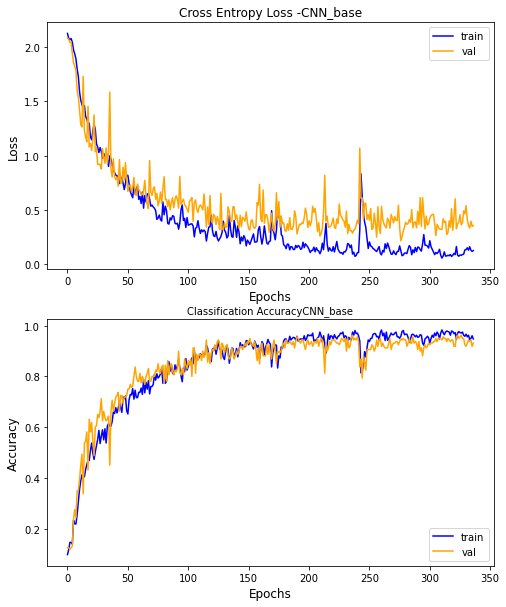

In [20]:
history_plot('CNN_base',history)

In [25]:
saved_model=load_model(checkpt_best_model)

dtime=datetime.now().strftime('%Y%m%d_%H%M%S')
_, acc=saved_model.evaluate(x_train,y_train,verbose=0)
print('Model evaluate on train, accuracy %.3f'%(acc*100))
_, acc=saved_model.evaluate(x_val,y_val,verbose=0)
print('Model evaluate on train, accuracy %.3f'%(acc*100))
_, acc=saved_model.evaluate(x_test,y_test,verbose=0)
print('Model evaluate on test, accuracy %.3f'%(acc*100))
acc_test=round(100*acc,2)

save_file=checkpt_best_model[0:-5]+'_'+dtime+'_acc'+str(
    acc_test)+'.h5'
print('Model saved: ',save_file)
saved_model.save(save_file,save_format='h5')

Model evaluate on train, accuracy 99.792
Model evaluate on train, accuracy 96.250
Model evaluate on test, accuracy 95.000
Model saved:  model/8Class_3Conv2Den_dataAugm_20210219_020509_acc95.0.h5


# 5. Prediction on test image

In [31]:
model = saved_model
test_gen=image_gen_test.flow(np.array(x_test),
                             batch_size=batch_size,
                             shuffle=False)
step_size_test=x_test.shape[0]//batch_size
print('predicting...')
predictions=model.predict(test_gen,steps=step_size_test)
y_pred=to_categorical(np.argmax(predictions,axis=1),num_classes)
print('done!')
print('number of predictions: ',len(predictions))

predicting...
done!
number of predictions:  160


In [32]:
# classification report
report_str=classification_report(
    y_test,y_pred,target_names=category_names)
print(report_str)

                   precision    recall  f1-score   support

     agricultural       1.00      0.85      0.92        20
           forest       0.87      1.00      0.93        20
   mobilehomepark       0.95      1.00      0.98        20
         overpass       0.91      1.00      0.95        20
       parkinglot       0.95      0.95      0.95        20
            river       1.00      0.95      0.97        20
           runway       0.95      1.00      0.98        20
sparseresidential       1.00      0.85      0.92        20

        micro avg       0.95      0.95      0.95       160
        macro avg       0.95      0.95      0.95       160
     weighted avg       0.95      0.95      0.95       160
      samples avg       0.95      0.95      0.95       160



In [34]:
# Confusion matrix
conf_mat=confusion_matrix(
    y_test.argmax(axis=1),predictions.argmax(axis=1))
conf_mat

array([[17,  2,  0,  0,  0,  0,  1,  0],
       [ 0, 20,  0,  0,  0,  0,  0,  0],
       [ 0,  0, 20,  0,  0,  0,  0,  0],
       [ 0,  0,  0, 20,  0,  0,  0,  0],
       [ 0,  0,  1,  0, 19,  0,  0,  0],
       [ 0,  0,  0,  1,  0, 19,  0,  0],
       [ 0,  0,  0,  0,  0,  0, 20,  0],
       [ 0,  1,  0,  1,  1,  0,  0, 17]])

In [47]:
def plot_cm(y_true,y_pred,figsize=(12,10)):
    # y_true: true labels
    # y_pred: predicted labels
    cm=confusion_matrix(y_true, y_pred, labels=np.unique(y_true))
    
    cm_sum=np.sum(cm,axis=1,keepdims=True)
    cm_perc=cm/cm_sum.astype(float)*100
    annot=np.empty_like(cm).astype(str)
    
    nrows, ncols=cm.shape
    
    for i in range(nrows):
        for j in range(ncols):
            c=cm[i,j]
            p=cm_perc[i,j]
            if i==j:
                s=cm_sum[i]
                annot[i,j]='%d/%d'%(c,s)
            elif c==0:
                annot[i,j]=''
            elif i<j:
                annot[i,j]='%d'%(c)
            else:
                annot[i,j]='%d'%(c)
            
    cm=pd.DataFrame(cm,
                    index=category_names,
                    columns=category_names)
    cm.index.name='Actual'
    cm.columns.name='Predicted'
    fig,ax=plt.subplots(figsize=figsize)
    sns.set(font_scale=1.4)
    sns.heatmap(cm,cmap='YlGnBu',annot=annot,fmt='',
                ax=ax, annot_kws={'fontsize':12})

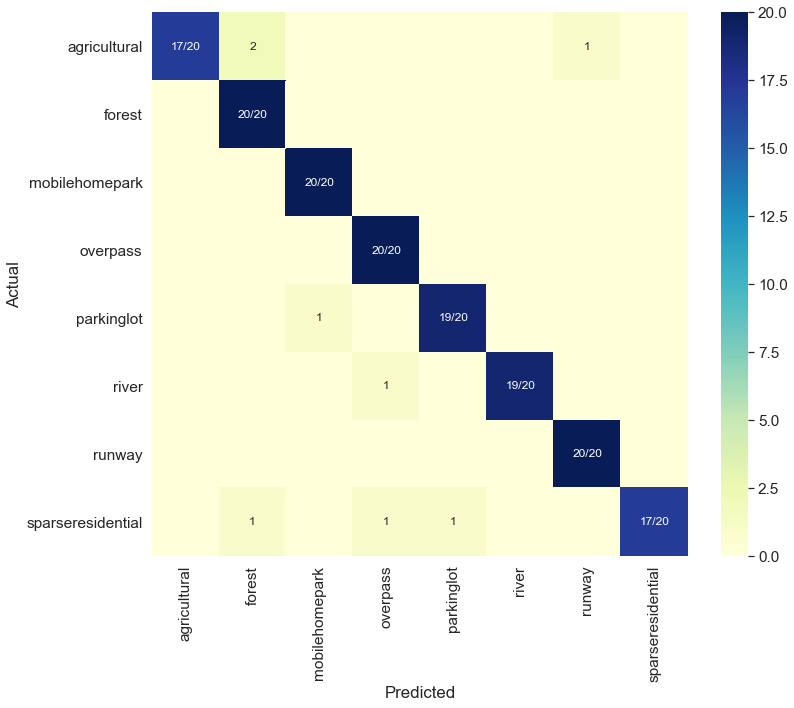

In [48]:
plot_cm(y_test.argmax(axis=1),predictions.argmax(axis=1))

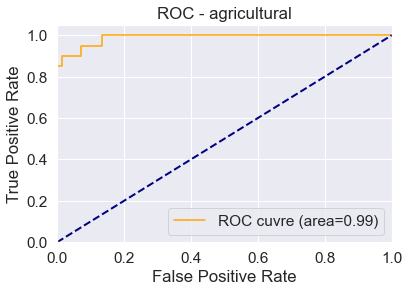

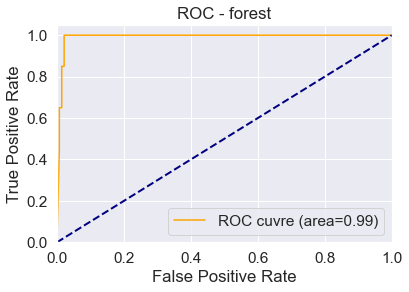

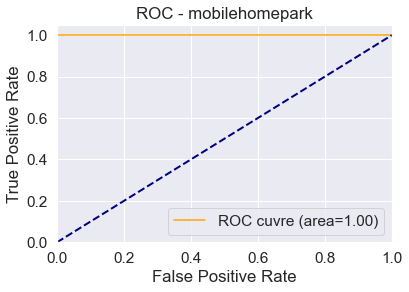

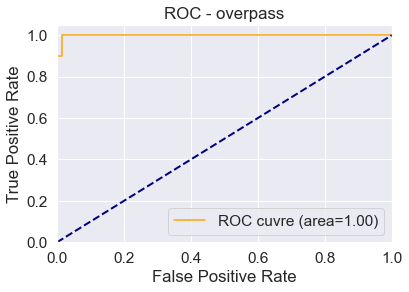

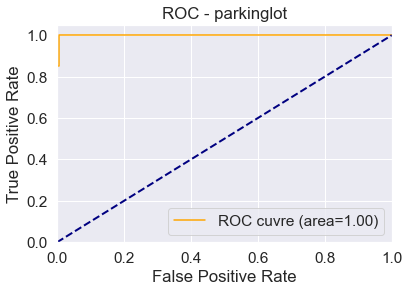

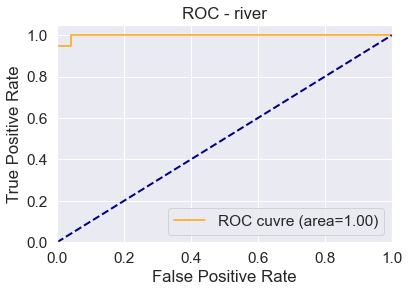

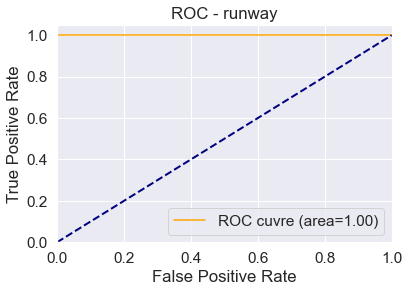

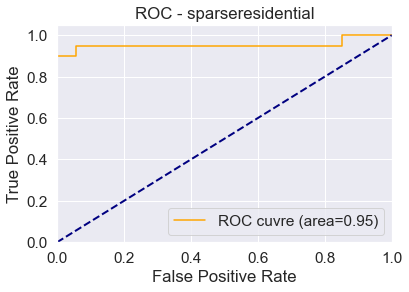

In [51]:
y_score=model.predict(x_test)

# compute ROC curve and area for each class
fpr=dict()
tpr=dict()
roc_auc=dict()

for i in range(num_classes):
    # collect the roc curve for different category (i)
    fpr[i], tpr[i], _=roc_curve(y_test[:,i],y_score[:,i])
    
    roc_auc[i]=auc(fpr[i],tpr[i])

for i in range(num_classes):
    plt.figure()
    plt.plot(fpr[i],tpr[i],color='orange',
             label='ROC cuvre (area=%0.2f)'%roc_auc[i])
    plt.plot([0,1],[0,1],color='navy', lw=2, linestyle='--')
    plt.xlim([0,1])
    plt.ylim([0,1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC - '+category_names[i])
    plt.legend(loc='lower right')
    plt.show()

In [53]:
# see how the images with predicted labels look

def plotImages_categories(images, labels, predictions,
                          n_cols=4, figsize=(10,10)):
    fig, axes=plt.subplots(
        math.ceil(len(images)/n_cols),n_cols,figsize=figsize)
    axes=axes.flatten()
    
    for i in range(
        math.ceil(len(images)/n_cols)*n_cols):
        
        axes[i].set_xticks(())
        axes[i].set_yticks(())
        
        if i < len(images):
            
            axes[i].imshow(images[i])
            
            if predictions is not None:
                title = 'LABEL:{}\nPRED:{}'.format(
                    labels[i],predictions[i])
                
                if predictions[i]!=labels[i]:
                    [j.set_linewidth(5) for j in axes[i].spines.values()]
                    [j.set_color('red') for j in axes[i].spines.values()]
                    
            else:
                title='LABEL:{}'.format(labels[i])
            axes[i].set_title(title, fontdict={'family':'monospace'},
                              loc='left',fontsize=12)
    plt.tight_layout()
    plt.show()


Category:agricultural, Total Samples:20


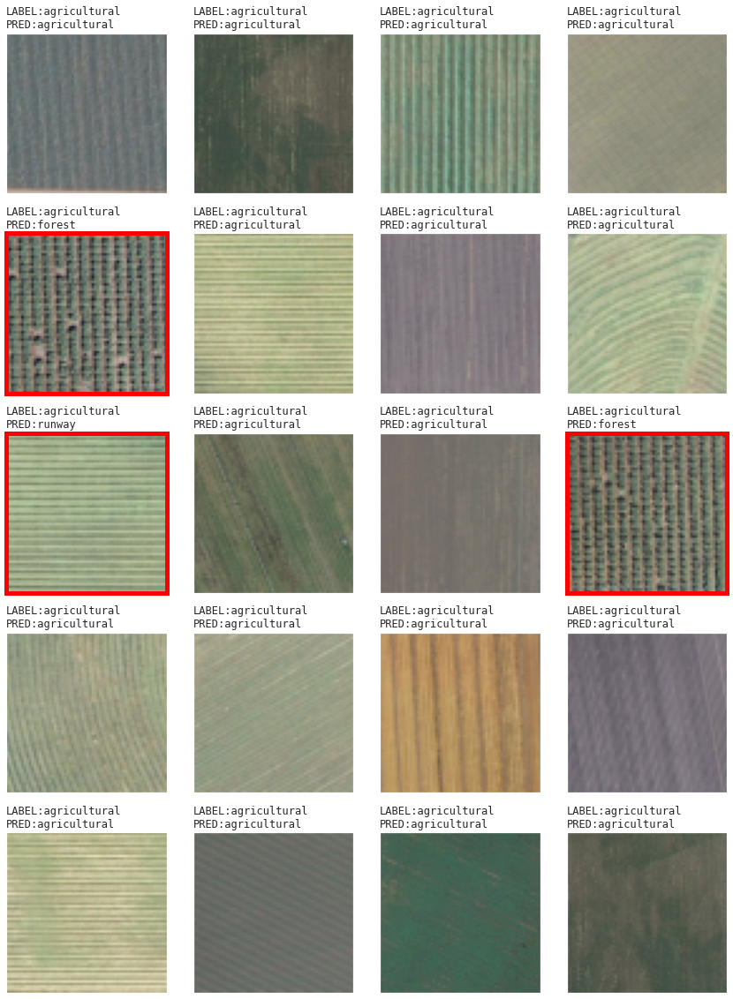


Category:forest, Total Samples:20


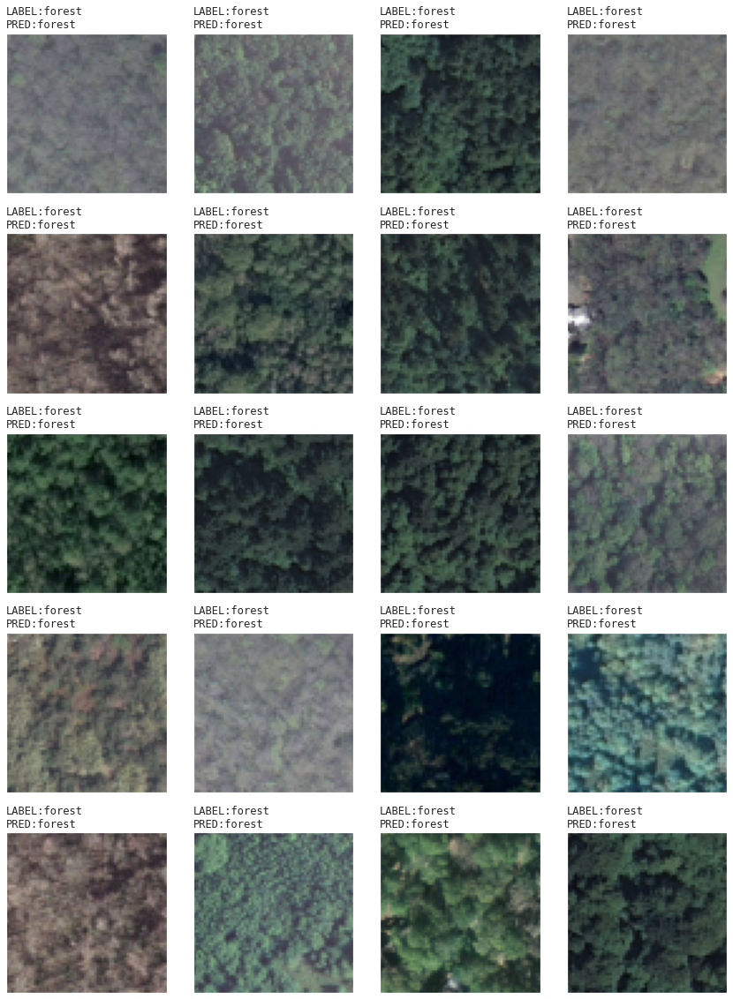


Category:mobilehomepark, Total Samples:20


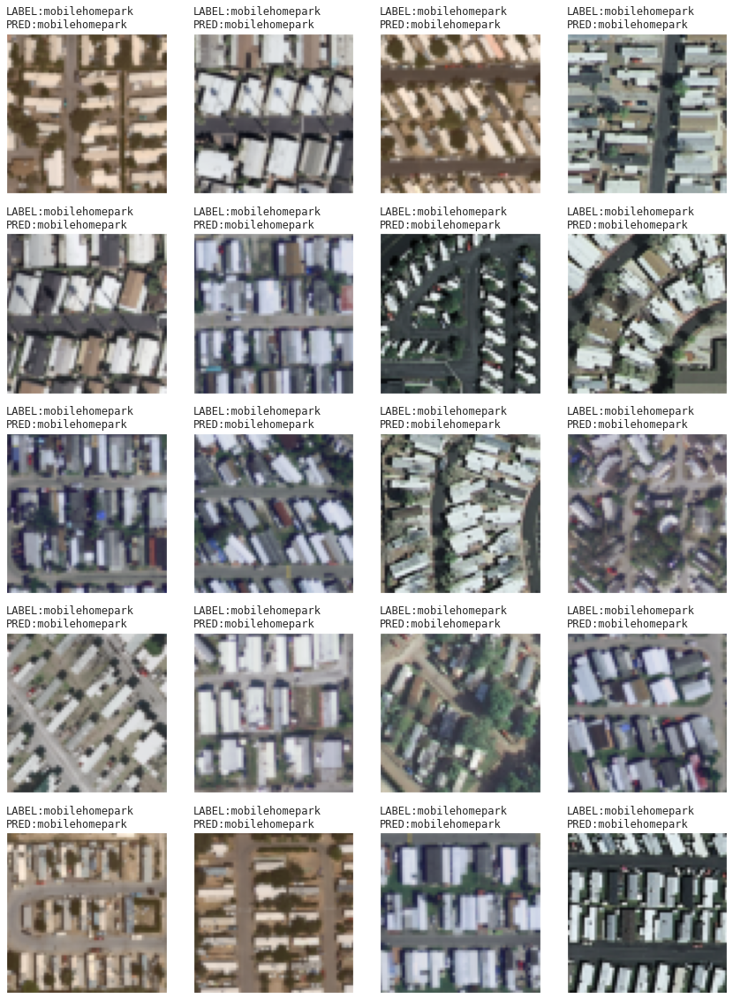


Category:overpass, Total Samples:20


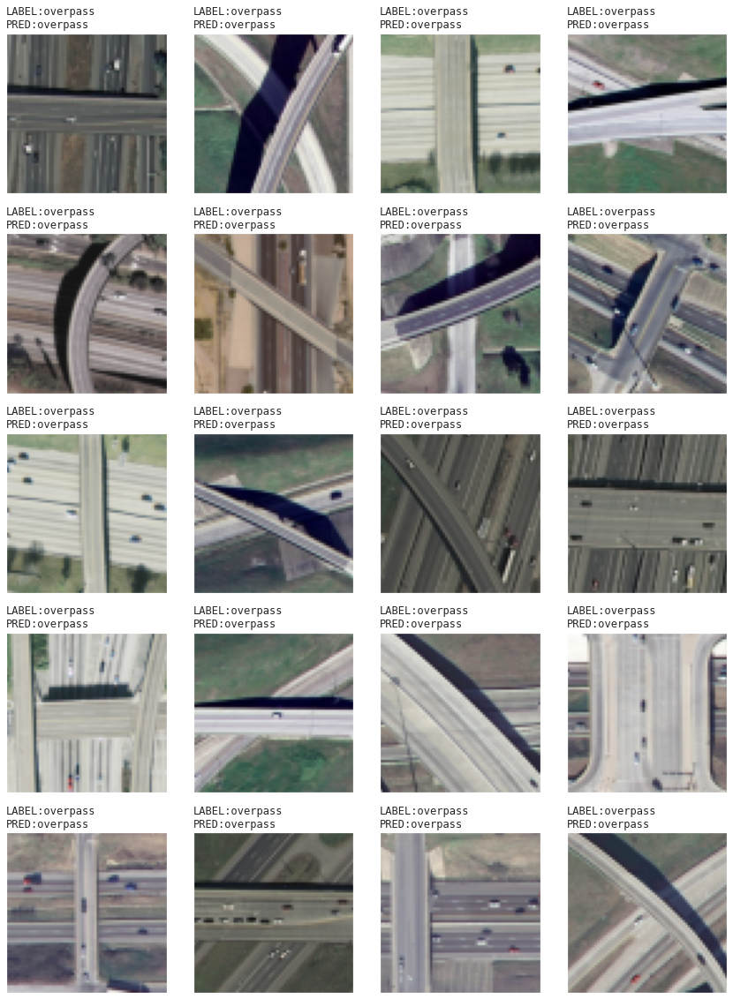


Category:parkinglot, Total Samples:20


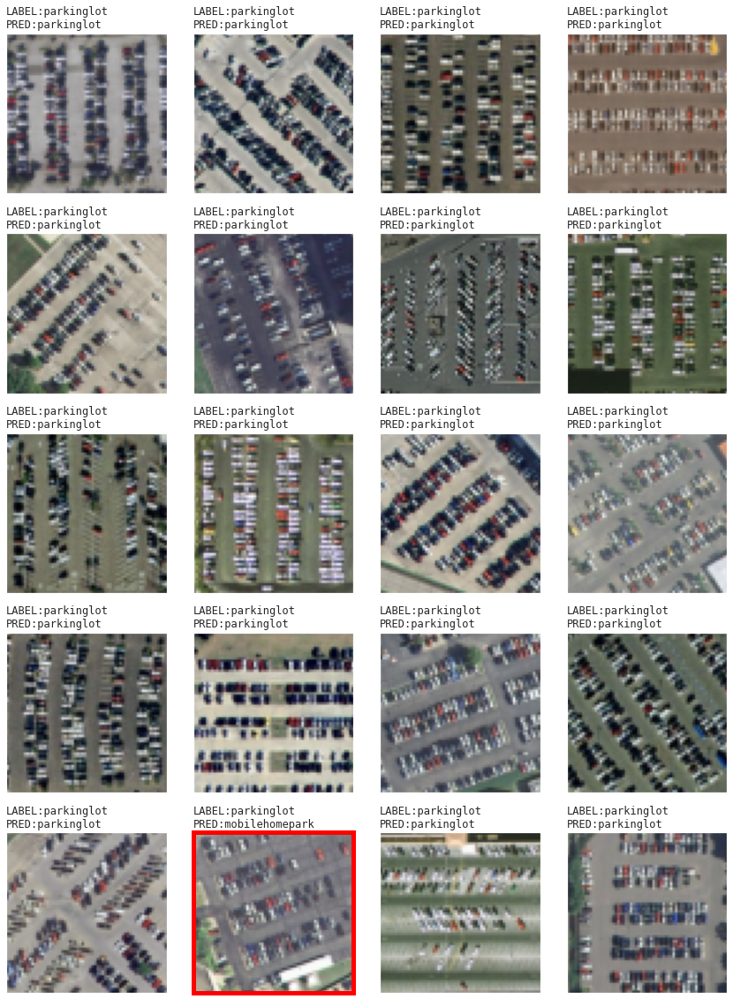


Category:river, Total Samples:20


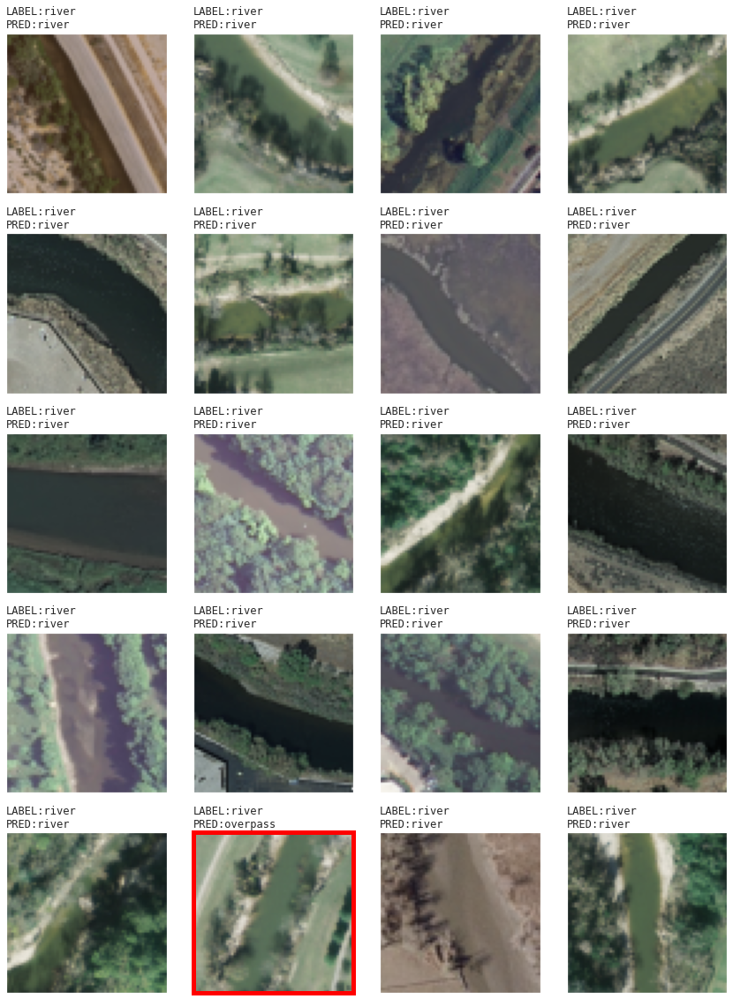


Category:runway, Total Samples:20


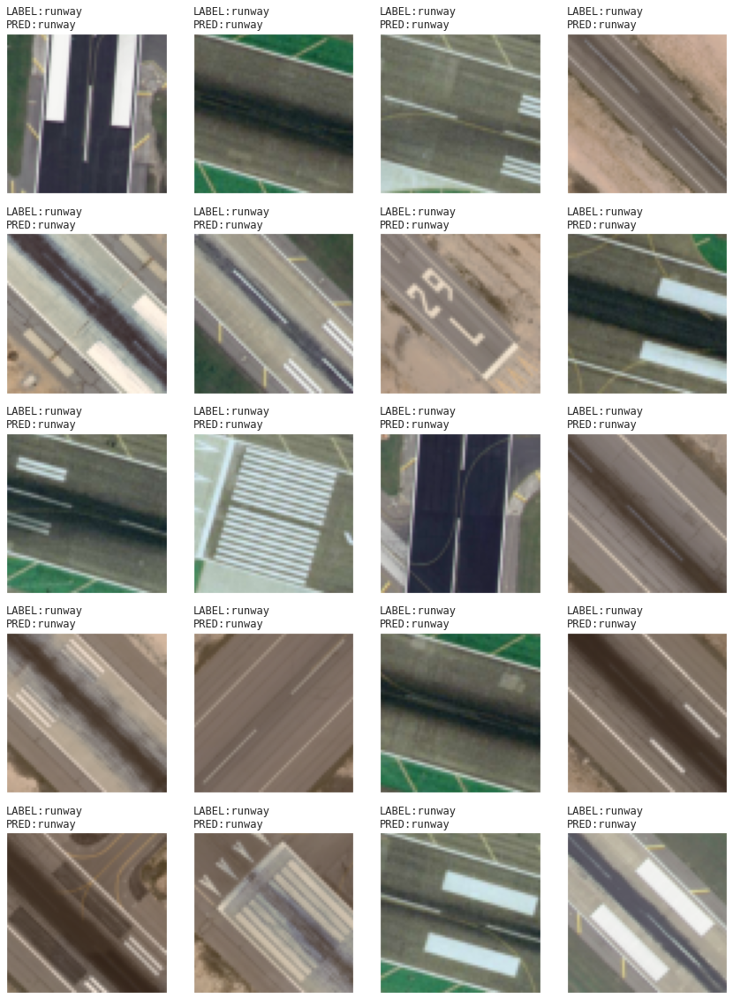


Category:sparseresidential, Total Samples:20


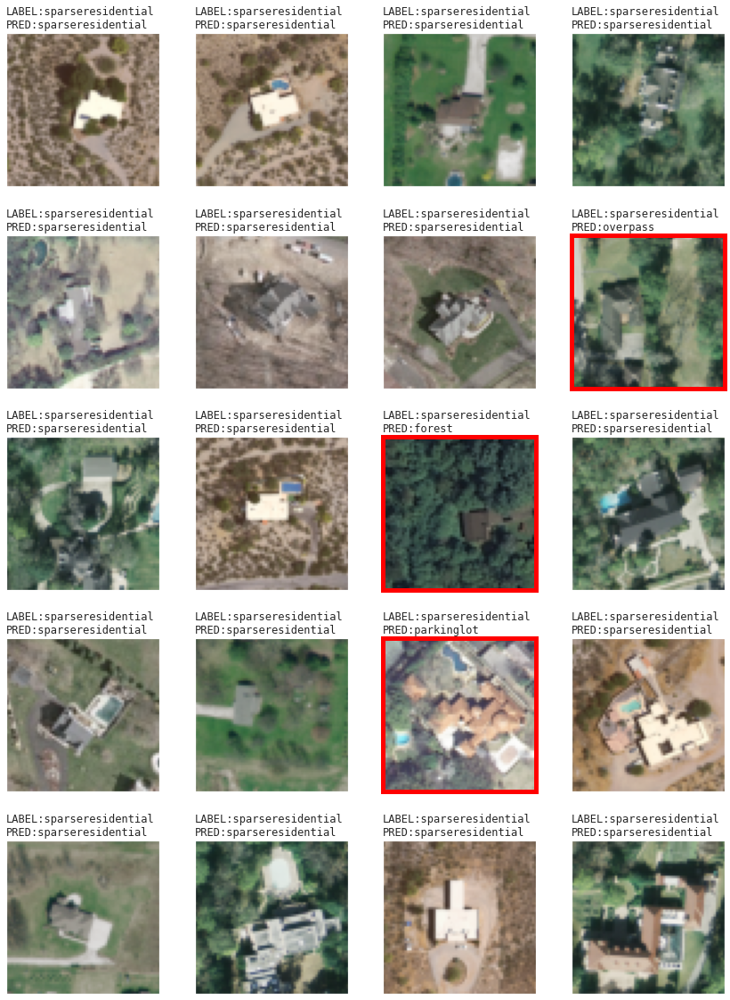

In [57]:
for i in range(len(category_names)):
    cat=[]
    cat_pred=[]
    x_test_cat=[]
    for j in range(len(y_test)):
        if y_test.argmax(axis=1)[j]==i:
            cat.append(category_names[i])
            cat_pred.append(
                category_names[predictions.argmax(axis=1)[j]])
            x_test_cat.append(x_test[j])
            
    print('\nCategory:{}, Total Samples:{}'.format(
        category_names[i],len(cat)))
    
    plotImages_categories(images=x_test_cat,
                          labels=cat,
                          predictions=cat_pred,
                          figsize=(12,16))